# Deception strategies evaluation

In [1]:
%%capture
%pip install scipy
%pip install seaborn
%pip install -U pandas
%pip install plotly
%pip install -U six
%pip install "jupyterlab>=3" "ipywidgets>=7.6"
%pip install jupyter-dash

In [2]:
%load_ext autoreload
%autoreload

In [3]:
import tqdm
import matplotlib

In [4]:
import numpy as np
import os
import datetime
import yaml
import json
from dotenv import load_dotenv, dotenv_values

import scipy
import matplotlib as mpl
from matplotlib import pyplot as plt
from matplotlib.pyplot import cm
import seaborn as sns
import pandas as pd
pd.options.plotting.backend = "plotly"

In [5]:
import plotly.offline as pyo
import plotly.io as pio
pio.templates
import seaborn as sns
pyo.init_notebook_mode()
import plotly.graph_objects as go
from ipywidgets import interact
#matplotlib.rc_file_defaults()

In [6]:
log_dir = os.path.join('/', 'logs','exper', "notebook_dql_debug_with_tinymicro")

load_dotenv(override=True)
env_config = json.loads(json.dumps(dotenv_values()))


## Retrieving data from file with deteciton points results

In [7]:
max_episode_steps = 50
# log_results = os.getenv("LOG_RESULTS", 'False').lower() in ('true', '1', 't')
# gymid = os.getenv("GYMID", 'CyberBattleTinyMicro-v0')
# log_level = os.getenv('LOG_LEVEL', "info")
# iteration_count = None
# eval_episode_count = int(os.getenv('EVAL_EPISODE_COUNT', 0))
# training_episode_count = None
# train_while_exploit = False
# exploit_train = "exploit_train"   # "exploit_manual"

# log_dir = '/root/logs/exper/' + "notebook_dql_debug_with_tinymicro"
# # convert the datetime object to string of specific format
# log_level = os.getenv('LOG_LEVEL', "info")
# checkpoint_name = 'manual' if os.getenv('CHECKPOINT', 'manual').lower() in ('manual') else os.environ['CHECKPOINT'].lower()
iteration_count = None
# checkpoint_date = None

In [8]:
# # %%
iteration_count = max_episode_steps if iteration_count is None else iteration_count
# os.environ['TRAINING_EPISODE_COUNT'] = os.getenv('TRAINING_EPISODE_COUNT', '3000') if training_episode_count is None else str(training_episode_count)
# training_episode_count = int(os.environ['TRAINING_EPISODE_COUNT'])
# checkpoint_date = os.getenv('CHECKPOINT_DATE', '20230124_085534')

# # checkpoint_date = '20230126_233444'

# datetime_str = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
# checkpoint_dir = os.path.join("/root/logs/exper/" + "notebook_dql_debug_with_tinymicro", gymid, checkpoint_date)
# assert checkpoint_name in ('best', 'manual') or checkpoint_name.isnumeric(), f"Checkpoint name {checkpoint_name} is not manual, best or stepsdone number"

# os.environ['LOG_DIR'] = log_dir
# os.environ['LOG_RESULTS'] = str(log_results).lower()

In [13]:
%%capture
all_expers = {key:[value for value in sorted(os.listdir(os.path.join(log_dir, key)))] for key in os.listdir(log_dir) if os.path.isdir(os.path.join(log_dir, key))}
# expers = {"CyberBattleTinyMicro-v1":["20230225_232921"], "wCyberBattleTinyMicro-v100":["20230127_105321", "20230127_105636"]}
all_expers

In [14]:
csr_type_mapping = {'indices': 0, 'indptr': 1, 'eplength': 2}
all_detection_points_results = {}
for gymid in all_expers:
    for date in all_expers[gymid]:
        checkpoint_dir = os.path.join(log_dir, gymid, date)
        csr_matrix = np.load(os.path.join(checkpoint_dir, 'training', 'detection_points_results.npz'))
        
        exper_name = gymid + '.' + date
        all_detection_points_results[exper_name] = {}
        for key in csr_matrix:
            name, data_type = '_'.join(key.split('_')[:-1]), key.split('_')[-1]
            all_detection_points_results[exper_name][name] = all_detection_points_results[exper_name].get(name, dict())
            all_detection_points_results[exper_name][name].update({data_type: csr_matrix[key]})
            

# all_detection_points_dict = {}
# for exper in all_detection_points_results:
#     for k in all_detection_points_results[exper].keys():
#         name, data_type = '_'.join(k.split('_')[:-1]), k.split('_')[-1]
#         all_detection_points_dict[exper + '.' + name] = all_detection_points_dict.get(exper + '.' + name, dict())
#         all_detection_points_dict[exper + '.' + name].update({data_type: all_detection_points_results[exper][k]})

expers = {key: sorted(all_expers[key][-3:]) for key in all_expers if len(all_expers[key])}
detection_points_results = {exper_name: value for exper_name, value in all_detection_points_results.items() 
                         if exper_name.split('.')[1] in ''.join(map(lambda x: ''.join(x), expers.values()))}
expers

{'CyberBattleTinyMicro-v234': ['20230503_035639',
  '20230503_114044',
  '20230503_192330'],
 'CyberBattleTinyMicro-v1': ['20230503_045753',
  '20230503_124213',
  '20230503_202541'],
 'CyberBattleTinyMicro-v134': ['20230503_032856',
  '20230503_111232',
  '20230503_185534'],
 'CyberBattleTinyMicro-v24': ['20230503_012633',
  '20230503_090828',
  '20230503_165155'],
 'CyberBattleTinyMicro-v3': ['20230503_055946',
  '20230503_134352',
  '20230503_212820'],
 'CyberBattleTinyMicro-v2': ['20230503_053021',
  '20230503_131453',
  '20230503_205834'],
 'CyberBattleTinyMicro-v1234': ['20230503_042954',
  '20230503_121406',
  '20230503_195710'],
 'CyberBattleTinyMicro-v23': ['20230503_005331',
  '20230503_083556',
  '20230503_161910'],
 'CyberBattleTinyMicro-v14': ['20230503_002115',
  '20230503_080323',
  '20230503_154637'],
 'CyberBattleTinyMicro-v124': ['20230503_025602',
  '20230503_103909',
  '20230503_182234'],
 'CyberBattleTinyMicro-v34': ['20230503_015525',
  '20230503_093745',
  '20230

### Logfile check

In [40]:
exper_name = 'CyberBattleTinyMicro-v' + '1234'
data = pd.read_csv(os.path.join(log_dir, exper_name, expers[exper_name][-1], 'logfile.log'), sep='%%', header=None, names=["logfile"])

/tmp/ipykernel_47359/3241751069.py:2: ParserWarning:

Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.



In [41]:
data

,logfile
0,[2023-03-08 09:00:22] INFO: Loading env variab...
1,"{'CUDA_VISIBLE_DEVICES': '0', 'LOG_RESULTS': '..."
2,[2023-03-08 09:00:23] INFO: ###### DQL
3,"Learning with: episode_count=2000,iteration_co..."
4,"batch=512, target_update=5"
...,...
365662,[2023-03-08 09:28:13] INFO: Step 12
365663,[2023-03-08 09:28:13] INFO: GOT REWARD r=114.0...
365664,[2023-03-08 09:28:13] INFO: Customer Data leak...
365665,[2023-03-08 09:28:13] INFO: Step 13


## Pandas DF

In [ ]:
df_columns=['gymid', 'date', 'dp_name', 'indices','epnumber' ,'eplength']
# [int(step) for step in x[1:-1].replace(' ', '').split(',') if step.strip()]
try:
    # raise FileNotFoundError 
    global_df = pd.read_csv(os.path.join(log_dir, "deception_results_v2.csv"), sep='|', header=0,
                     names=df_columns, dtype=dict(zip(df_columns, ['str', 'str', 'str', 'str', int, int])),
                     converters={'indices': lambda str_list: [int(step) 
                                                             for step in str_list[1:-1].replace(' ', ',').replace("'", "").split(',') 
                                                             if step]},
                     parse_dates=['date'], date_format="%Y%m%d_%H%M%S")
except FileNotFoundError:
    global_df = pd.DataFrame([], columns=df_columns)
    for exper_name in tqdm.tqdm(detection_points_results):
        version, date = exper_name.split('.')
        for dp_name in detection_points_results[exper_name]:
            results = detection_points_results[exper_name][dp_name]
            indptr, indices, eplength = results['indptr'], results['indices'], results['eplength']
            for n, (indptr_start, indptr_end) in enumerate(zip(indptr[:-1], indptr[1:])):
                global_df = pd.concat([global_df, 
                                pd.DataFrame([[version, date, dp_name, indices[indptr_start:indptr_end], 
                                               n, eplength[n]]], 
                                               columns=df_columns)], ignore_index=True)   

 89%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████              | 40/45 [1:55:35<25:48, 309.64s/it]

In [18]:
### Saving: 
global_df.to_csv(os.path.join(log_dir, "deception_results_v2.csv"), sep='|')

In [22]:
global_df = df.copy()

df = df[(df["date"] > '20230420') | df["dp_name"].str.contains("1234")]

In [23]:
#pd.DataFrame.groupby(
valid_indexes = df['indices'].map(lambda x: len(x) > 0)
df_valid_indices = df[valid_indexes].copy()


df_valid_indices.groupby(lambda x: len(df.loc[x]["gymid"].split('-v')[-1])).size().rename("hts", inplace=True)
df_valid_indices.style
print("Ratio: eps_with_hts/eps", len(df[valid_indexes].index)/len(df.index)*100)

Ratio: eps_with_hts/eps 23.09955657012223


In [24]:
df_valid_indices

,gymid,date,dp_name,indices,epnumber,eplength
10,CyberBattleTinyMicro-v234,20230503_035639,DP_admin,[26],10,50
12,CyberBattleTinyMicro-v234,20230503_035639,DP_admin,[39],12,50
159,CyberBattleTinyMicro-v234,20230503_035639,DP_admin,[49],159,50
218,CyberBattleTinyMicro-v234,20230503_035639,DP_admin,[16],218,50
241,CyberBattleTinyMicro-v234,20230503_035639,DP_admin,"[42, 43, 44]",241,50
...,...,...,...,...,...,...
601383,CyberBattleTinyMicro-v4,20230503_220111,HT4_cloudactivedefense,[16],2005,22
601419,CyberBattleTinyMicro-v4,20230503_220111,HT4_cloudactivedefense,[4],2041,15
601429,CyberBattleTinyMicro-v4,20230503_220111,HT4_cloudactivedefense,[8],2051,28
601430,CyberBattleTinyMicro-v4,20230503_220111,HT4_cloudactivedefense,[4],2052,15


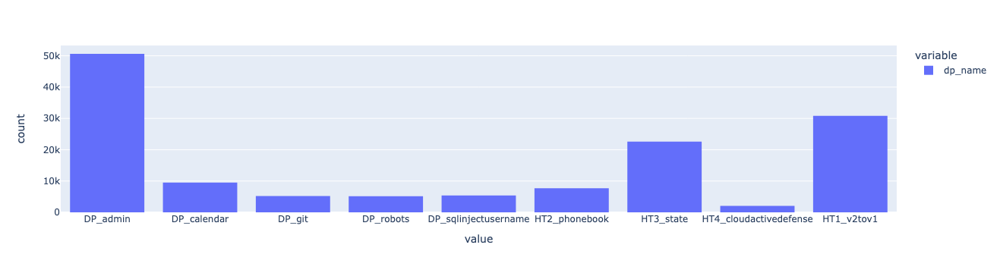

In [25]:
df_valid_indices["dp_name"].hist()

### Plotting

In [26]:
df_valid_indices.columns

Index(['gymid', 'date', 'dp_name', 'indices', 'epnumber', 'eplength'], dtype='object')

In [27]:
df["n_ht"] = df["gymid"].apply(lambda x: len(x.split('-v')[-1]))
df_valid_indices["n_ht"] = df_valid_indices["gymid"].apply(lambda x: len(x.split('-v')[-1]))
df_valid_indices["first_ind"] = df_valid_indices["indices"].apply(lambda x: x[0])

grouped = df.groupby("n_ht")
valid_grouped = df_valid_indices.groupby("n_ht")

df_valid_indices.loc[df_valid_indices["n_ht"] == 2, "indices"][:100].apply(lambda x: x[0]).mean()
valid_grouped.nth[:100].groupby("n_ht").apply(lambda x : x["indices"].apply(lambda y: y[-1])).groupby("n_ht")

In [28]:
df_valid_indices.groupby(["gymid", "n_ht"]).size()

gymid                       n_ht
CyberBattleTinyMicro-v1     1        8032
CyberBattleTinyMicro-v12    2        9678
CyberBattleTinyMicro-v123   3       11454
CyberBattleTinyMicro-v1234  4       11795
CyberBattleTinyMicro-v124   3        9146
CyberBattleTinyMicro-v13    2       10635
CyberBattleTinyMicro-v134   3       12872
CyberBattleTinyMicro-v14    2        8018
CyberBattleTinyMicro-v2     1        7114
CyberBattleTinyMicro-v23    2        8581
CyberBattleTinyMicro-v234   3        9194
CyberBattleTinyMicro-v24    2        6386
CyberBattleTinyMicro-v3     1        9725
CyberBattleTinyMicro-v34    2        8536
CyberBattleTinyMicro-v4     1        7870
dtype: int64

In [29]:
df_valid_indices.groupby(["gymid", "n_ht"]).size().unstack(level="gymid")

gymid,CyberBattleTinyMicro-v1,CyberBattleTinyMicro-v12,CyberBattleTinyMicro-v123,CyberBattleTinyMicro-v1234,CyberBattleTinyMicro-v124,CyberBattleTinyMicro-v13,CyberBattleTinyMicro-v134,CyberBattleTinyMicro-v14,CyberBattleTinyMicro-v2,CyberBattleTinyMicro-v23,CyberBattleTinyMicro-v234,CyberBattleTinyMicro-v24,CyberBattleTinyMicro-v3,CyberBattleTinyMicro-v34,CyberBattleTinyMicro-v4
n_ht,,,,,,,,,,,,,,,
1,8032.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7114.0,NaN,NaN,NaN,9725.0,NaN,7870.0
2,NaN,9678.0,NaN,NaN,NaN,10635.0,NaN,8018.0,NaN,8581.0,NaN,6386.0,NaN,8536.0,NaN
3,NaN,NaN,11454.0,NaN,9146.0,NaN,12872.0,NaN,NaN,NaN,9194.0,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,11795.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


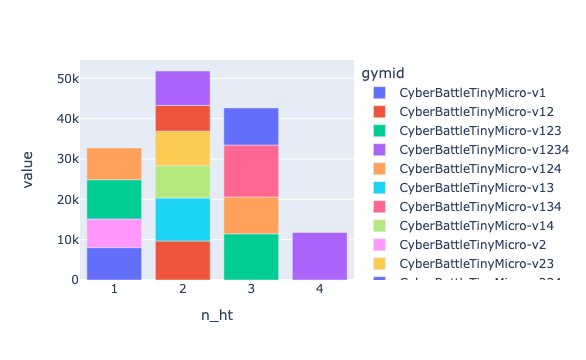

In [31]:
df_valid_indices.groupby(["gymid", "n_ht"]).size().unstack(level="gymid").plot(kind="bar") # , width=1000, height=600

In [32]:
import plotly.express as px


vis_df = df_valid_indices.groupby(["n_ht", "dp_name"]).\
    apply(lambda x : x["indices"].apply(lambda y: y[0])).\
    groupby(["n_ht", "dp_name"])
# fig = px.scatter(vis_df, x="n_ht", animation_frame="year", animation_group="country",
#            size="pop", color="continent", hover_name="country",
#            log_x=True, size_max=55, range_x=[100,100000], range_y=[25,90])

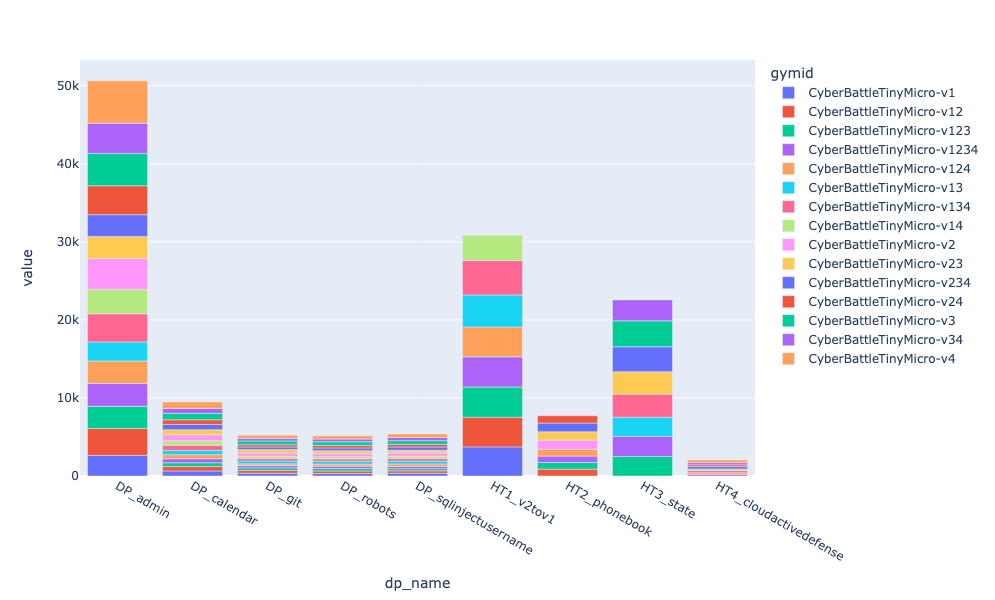

In [33]:
df_valid_indices.groupby(["gymid", "dp_name"]).size().unstack(
    level="gymid").plot(kind="bar", width=1000, height=600)

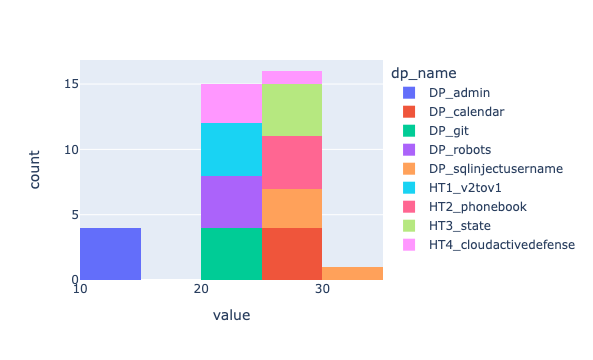

In [34]:
vis_df.mean().unstack("dp_name").hist(by="n_ht")

In [35]:
%%script false --no-raise-error
vis_df['cum_sum'] = vis_df.apply(lambda p: p.shift(fill_value=0).cumsum())
vis_df['cum_mean'] = vis_df['cum_sum'] / vis_df.cumcount()

In [36]:
%%script false --no-raise-error
vis_df['cum_sum'] = vis_df.apply(lambda p: p.shift(fill_value=0).cumsum())
vis_df['cum_mean'] = vis_df['cum_sum'] / vis_df.cumcount()

In [37]:
%%script false --no-raise-error
vis_df.reset_index(0).drop(columns='n_ht').index

vis_df.index

vis_df = vis_df.reset_index(1).reset_index(1)
#vis_df.columns = ['index',  'indices']
vis_df

vis_df.groupby("n_ht").apply()

import plotly.express as px

fig = px.line(vis_df, x="n_ht", y="indices"
fig.show()

/usr/local/lib/python3.9/dist-packages/plotly/graph_objs/_deprecations.py:378: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




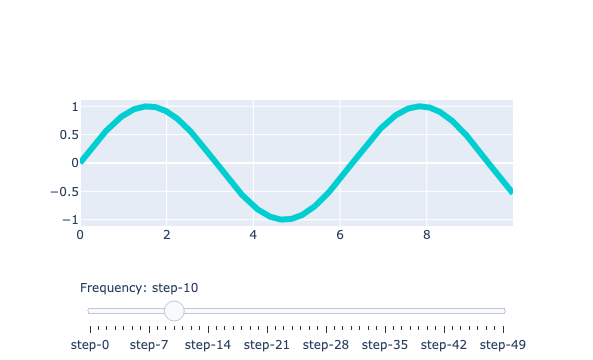

In [38]:
import plotly.graph_objects as go
import numpy as np

# Create figure
fig = go.Figure()

# Add traces, one for each slider step
for step in np.arange(0, 5, 0.1):
    fig.add_trace(
        go.Line(
            visible=False,
            line=dict(color="#00CED1", width=6),
            #name="𝜈 = " + str(step),
            x=np.arange(0, 10, 0.01),
            y=np.sin(step * np.arange(0, 10, 0.01))))

# Make 10th trace visible
fig.data[10].visible = True

# Create and add slider
steps = []
for i in range(len(fig.data)):
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)},
              {"title": "Slider switched to step: " + str(i)}],  # layout attribute
    )
    step["args"][0]["visible"][i] = True  # Toggle i'th trace to "visible"
    steps.append(step)

sliders = [dict(
    active=10,
    currentvalue={"prefix": "Frequency: "},
    pad={"t": 50},
    steps=steps
)]

fig.update_layout(
    sliders=sliders
)

fig.show()

In [39]:
num_episodes = valid_grouped.size().max()
valid_grouped.nth[:num_episodes].groupby(["n_ht"]).\
    filter(lambda x: "DP" not in x["dp_name"])

,gymid,date,dp_name,indices,epnumber,eplength,n_ht,first_ind
10,CyberBattleTinyMicro-v234,20230503_035639,DP_admin,[26],10,50,3,26
12,CyberBattleTinyMicro-v234,20230503_035639,DP_admin,[39],12,50,3,39
159,CyberBattleTinyMicro-v234,20230503_035639,DP_admin,[49],159,50,3,49
218,CyberBattleTinyMicro-v234,20230503_035639,DP_admin,[16],218,50,3,16
241,CyberBattleTinyMicro-v234,20230503_035639,DP_admin,"[42, 43, 44]",241,50,3,42
...,...,...,...,...,...,...,...,...
601383,CyberBattleTinyMicro-v4,20230503_220111,HT4_cloudactivedefense,[16],2005,22,1,16
601419,CyberBattleTinyMicro-v4,20230503_220111,HT4_cloudactivedefense,[4],2041,15,1,4
601429,CyberBattleTinyMicro-v4,20230503_220111,HT4_cloudactivedefense,[8],2051,28,1,8
601430,CyberBattleTinyMicro-v4,20230503_220111,HT4_cloudactivedefense,[4],2052,15,1,4


In [41]:
df_valid_indices.sort_values(['epnumber']).groupby(["n_ht","gymid"]).get_group(
    (1, "CyberBattleTinyMicro-v1"))["dp_name"].value_counts()

dp_name
HT1_v2tov1              3729
DP_admin                2636
DP_calendar              648
DP_git                   351
DP_sqlinjectusername     350
DP_robots                318
Name: count, dtype: int64

In [43]:
start_ep, end_ep = 0, None
slice_episodes = slice(start_ep, end_ep)
print(slice_episodes)
df_valid_indices.sort_values(['epnumber']).groupby(["n_ht","gymid"]).\
        nth[slice_episodes].groupby(["n_ht", "dp_name"]).\
        apply(lambda x : x["indices"].apply(lambda y: y[0])).\
        unstack(level=1).assign(avg=lambda x: x.mean(axis=1)).rename({"avg": 'DPs+' * True + 'HTs'}).\
        stack().groupby(["n_ht", "dp_name"]).\
        mean().unstack(level=1)

slice(0, None, None)


dp_name,DP_admin,DP_calendar,DP_git,DP_robots,DP_sqlinjectusername,HT1_v2tov1,HT2_phonebook,HT3_state,HT4_cloudactivedefense,avg
n_ht,,,,,,,,,,
1,11.335251,29.865260,23.962447,23.724483,28.621176,21.559936,28.019845,26.283954,23.573574,18.616078
2,12.093216,29.355650,23.173030,23.971414,28.826876,22.391581,28.202712,26.058244,24.642857,20.273585
3,11.930596,29.632566,24.227642,24.950637,28.932551,22.728963,27.993695,26.261442,25.479003,21.470070
4,10.081173,28.866279,22.141818,20.837209,30.055556,23.690759,28.345036,26.278471,24.159817,21.477745


In [44]:
df_valid_indices.sort_values(['epnumber']).groupby(["n_ht","gymid"]).unstack(level="n_ht")["epnumber"].hist()

AttributeError: 'DataFrameGroupBy' object has no attribute 'unstack'

In [45]:
df_valid_indices["dp_name"].unique()

array(['DP_admin', 'DP_calendar', 'DP_git', 'DP_robots',
       'DP_sqlinjectusername', 'HT2_phonebook', 'HT3_state',
       'HT4_cloudactivedefense', 'HT1_v2tov1'], dtype=object)

In [46]:
df_valid_indices.sort_values(['epnumber']).groupby(["n_ht","gymid", "date"]).\
    nth[slice_episodes].transform(lambda x: x.astype('str').str[:2] if x.name == "dp_name" else x).\
groupby(["n_ht", "dp_name"]).groups.keys()

dict_keys([(1, 'DP'), (1, 'HT'), (2, 'DP'), (2, 'HT'), (3, 'DP'), (3, 'HT'), (4, 'DP'), (4, 'HT')])

In [47]:
df_valid_indices.sort_values(['epnumber']).groupby(["n_ht","gymid", "date"]).\
    nth[slice_episodes].transform(lambda x: x.astype('str').str[:2] if x.name == "dp_name" else x).\
    groupby(["n_ht", "dp_name"]).transform(aggregation_func)
# .\
#     groupby(["n_ht", "dp_name", "epnumber"]).agg(agg_dict)


df_valid_indices.sort_values(['epnumber']).groupby(["n_ht","gymid", "date"]).\
    nth[slice_episodes].transform(lambda x: x.astype('str').str[:2] if x.name == "dp_name" else x).\
    groupby(["n_ht", "dp_name", "epnumber"]).apply(transf_func).\
    groupby(["n_ht", "dp_name", "epnumber"]).agg(agg_dict).groupby(["n_ht", "dp_name"]).mean().unstack(level="dp_name").\
    filter(regex='DP'*only_DP + '|'*only_HT*only_DP + 'HT'*only_HT, axis=1).plot()

In [ ]:
print('\n'.join(map(str, list(df_valid_indices.groupby(["gymid", "date"]).groups.keys()))))

('CyberBattleTinyMicro-v1', Timestamp('2023-04-20 13:30:56'))
('CyberBattleTinyMicro-v1', Timestamp('2023-04-22 01:23:44'))
('CyberBattleTinyMicro-v1', Timestamp('2023-04-22 08:07:22'))
('CyberBattleTinyMicro-v12', Timestamp('2023-04-20 08:05:22'))
('CyberBattleTinyMicro-v12', Timestamp('2023-04-21 20:25:43'))
('CyberBattleTinyMicro-v12', Timestamp('2023-04-22 03:12:55'))
('CyberBattleTinyMicro-v123', Timestamp('2023-04-20 11:10:07'))
('CyberBattleTinyMicro-v123', Timestamp('2023-04-21 23:13:01'))
('CyberBattleTinyMicro-v123', Timestamp('2023-04-22 05:56:43'))
('CyberBattleTinyMicro-v1234', Timestamp('2023-04-20 13:03:39'))
('CyberBattleTinyMicro-v1234', Timestamp('2023-04-22 00:59:17'))
('CyberBattleTinyMicro-v1234', Timestamp('2023-04-22 07:42:59'))
('CyberBattleTinyMicro-v124', Timestamp('2023-04-20 11:38:22'))
('CyberBattleTinyMicro-v124', Timestamp('2023-04-21 23:37:06'))
('CyberBattleTinyMicro-v124', Timestamp('2023-04-22 06:20:53'))
('CyberBattleTinyMicro-v13', Timestamp('2023-0

In [51]:
def vis_n_hts_to_metric(df = df, 
                        metric='first_occur', flag_include_DP = True, 
                        start_ep = 0, end_ep = None, use_min = True,
                       filename='', image_hw = None, only_HT=False, only_DP=False) -> None:
    '''
    Function to visualize different metrics from the number of Honeytokens'''
    
    grouped = df.sort_values(['epnumber']).groupby(["n_ht","gymid", "date"])
    num_episodes = grouped.size().max()
    if end_ep is None:
        end_ep = num_episodes
    slice_episodes = slice(start_ep, end_ep)
    
    df = df.sort_values(['epnumber']).groupby(["n_ht","gymid", "date"]).\
            nth[slice_episodes].copy()
    
    valid_indexes = df['indices'].map(lambda x: len(x) > 0)
    df_valid_indices = df[valid_indexes].copy()
                        
    image_h, image_w = image_hw if image_hw else (None, None)
    
    metrics = {'first_occur': (lambda x: x["indices"].apply(lambda y: y[0])), #  if x.name == "indices" else x 
               'freq': (lambda x: len(x["indices"])/x["eplength"] )}

    transf_func = metrics[metric]

    agg_dict = 'min' if use_min else 'mean'

    dp_names = df_valid_indices["dp_name"].unique()
    #print(dp_names)
    color_dict = dict(zip(np.concatenate((dp_names, ['DPs+' * flag_include_DP + 'HTs'])), 
                          [px.colors.qualitative.Alphabet[i] \
                           for i, dp_name in enumerate(df_valid_indices["dp_name"].unique()) if dp_name in dp_names]  + 
                          [px.colors.qualitative.Alphabet[-1]])) 
    # {'red zero line': '#FF0000', 'blue one line': '#0000FF'}
    
    if only_HT or only_DP:
        fig = df_valid_indices.transform(lambda x: x.astype('str').str[:2] if x.name == "dp_name" else x).\
            groupby(["n_ht", "dp_name", "epnumber"]).apply(transf_func).\
            groupby(["n_ht", "dp_name", "epnumber"]).agg(agg_dict).groupby(["n_ht", "dp_name"]).mean().unstack(level="dp_name").\
            filter(regex='DP'*only_DP + '|'*only_HT*only_DP + 'HT'*only_HT, axis=1).plot()
    else:
        boolean_not_include = ~df_valid_indices["dp_name"].str.contains("DP") if not flag_include_DP else slice(None, None)
        fig = df_valid_indices.groupby(["n_ht", "dp_name"]).\
            apply(lambda x : x["indices"].apply(lambda y: y[0])).\
            unstack(level=1).\
            stack().groupby(["n_ht", "dp_name"]).\
            mean().unstack(level=1).plot()

        #.assign(avg=lambda x:  x[boolean_not_include][[column for column in x.columns if not flag_include_DP or "DP" in column]].mean(axis=1)).rename(columns={"avg": }).

        fig.add_trace(df_valid_indices[boolean_not_include].groupby(["n_ht"]).\
            apply(lambda x : x["indices"].apply(lambda y: y[0])).\
            groupby(["n_ht"]).mean().plot().data[0].update(name='DPs+' * flag_include_DP + 'HTs'))
        
        for j in range(len(valid_grouped.nth[slice_episodes]["dp_name"].unique()) + 1): 
            for i in range(len(fig.data[j].x)):
                fig.data[i].line.color = px.colors.qualitative.Alphabet[i]
                alpha = np.pi*(2*np.random.rand() -1)
                fig.add_annotation(
                    x=fig.data[j].x[i] - (-1)**j*np.cos(alpha)/4,
                    y=fig.data[j].y[i] - (-1)**(j-1)*np.sin(alpha)/4,
                    text= f"{fig.data[j].y[i]:.2f}", #f"Point {i+1}",
                    showarrow=False,
                    yanchor= 'middle',
                    #arrowhead=7,
            #         ax=100,
            #         ay=100000
            )
    #pd.options.plotting.backend = "none"
    #ax.set_xticks(df["n_ht"].unique())
    
    hts_dps_str = 'HTs'*only_HT + '\\'*only_HT*only_DP + 'DPs'*only_DP

    #go.Scatter(x=, y=, mode='line+marker', name='DPs+HTs')
    fig.update_layout(
        xaxis = dict(
            range=[0, 5],
            #tickmode = 'linear',
            tickvals = df_valid_indices["n_ht"].unique(),
            tickmode = 'array'
            #dtick = 0.75
        ),
        title=f"Averaged over {hts_dps_str} first triggers among first {end_ep - start_ep} {'(All)' if end_ep == num_episodes else ''} episodes in all experiments",
        yaxis_title=str(f"First triggers during training <br>  ({'minimum' if use_min else 'average'} over {hts_dps_str})"),
        xaxis_title= f"Number of honeytokens used in the experiment"
    #     uniformtext_minsize=8, uniformtext_mode='hide'
    ).update_traces(mode='lines+markers', textposition='top center',
                            #marker_line_color= px.colors.discrete.Plasma_r[:7],
        #marker=dict(size=10,line=dict(width=0.5,color='DarkSlateGrey')),
                    #marker=dict(color=px.colors.sequential.Plasma_r)) # , layout=(2, 3)
    #                   selector=dict(mode='lines+markers')
    )
    
    style_templates = ["plotly", "plotly_white", "plotly_dark", "ggplot2", "seaborn", "simple_white", "none"]
    template = style_templates[-1]
    fig.update_layout(template=template)
    fig.show()
    if filename:
        pio.write_image(fig, filename, width=image_w, height=image_h)



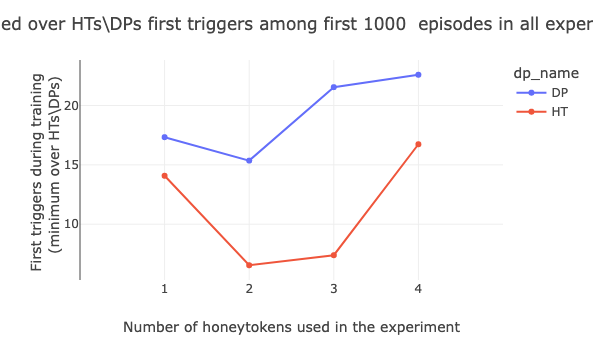

In [54]:
vis_n_hts_to_metric(flag_include_DP=False, end_ep=1000, only_HT=True, only_DP=True)

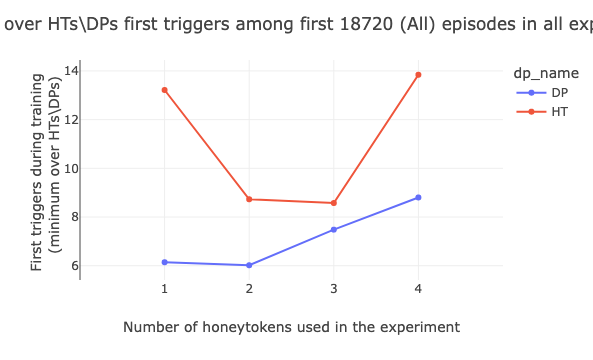

In [53]:
vis_n_hts_to_metric(flag_include_DP=False, end_ep=None, only_HT=True, only_DP=True)

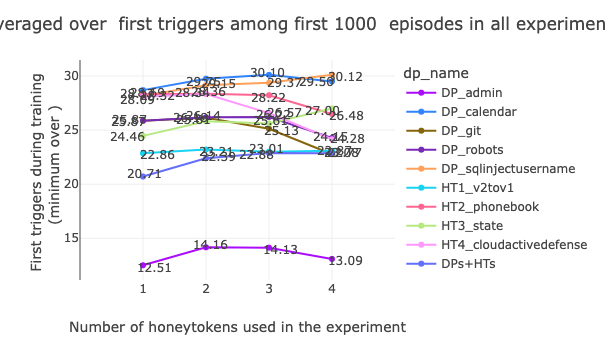

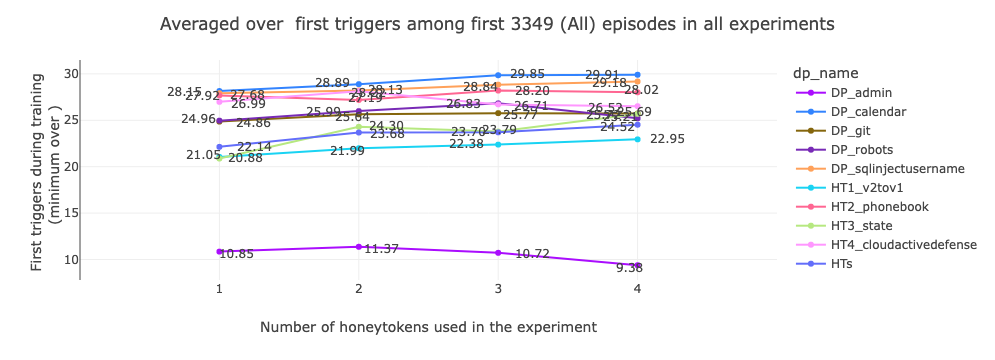

In [295]:
vis_n_hts_to_metric(flag_include_DP=True, end_ep=1000)
vis_n_hts_to_metric(flag_include_DP=False, end_ep=None)

In [ ]:
onlyDP, onlyHT = True, True
for form in ['pdf', 'png']:
    for end_ep in [1000, None]:
        vis_n_hts_to_metric(flag_include_DP=False, end_ep = end_ep, only_HT=onlyHT, only_DP=onlyDP) #,
                            #filename=os.path.join('/', 'logs', 'exper', f"first_occur_htsA_dpsNA_eps{(str(end_ep) if end_ep else 'A')}{'_HT'*onlyHT}{'_DP'*onlyDP}.{form}"))
        vis_n_hts_to_metric(flag_include_DP=True, end_ep = end_ep, only_HT=onlyHT, only_DP=onlyDP),
                            #filename=os.path.join('/', 'logs', 'exper', f"first_occur_htsA_dpsA_eps{(str(end_ep) if end_ep else 'A')}{'_HT'*onlyHT}{'_DP'*onlyDP}.{form}"))

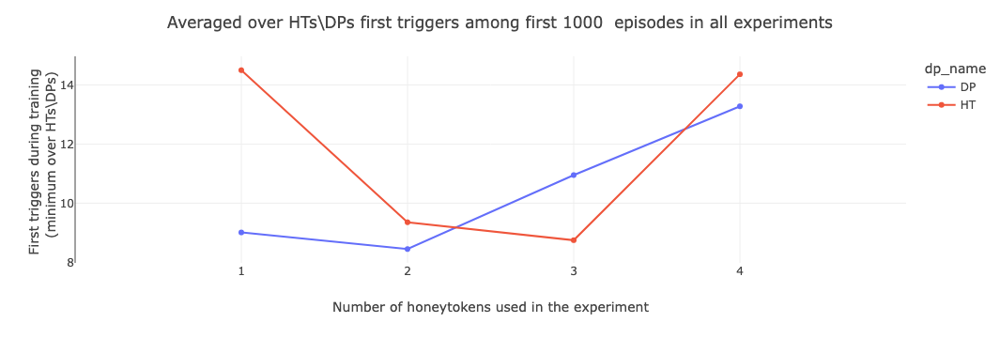

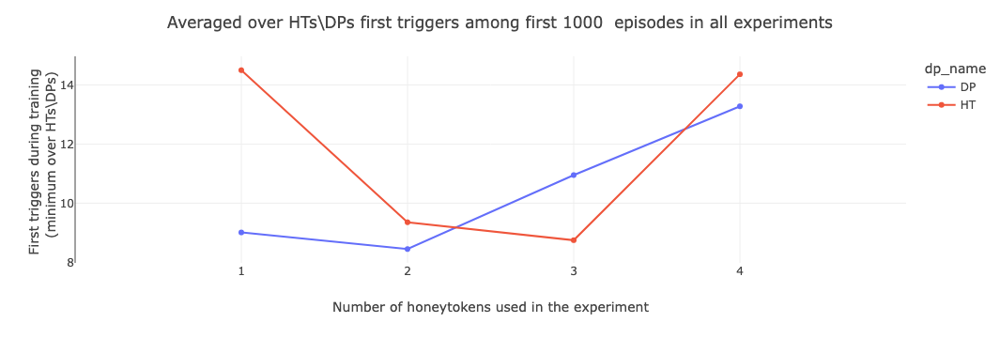

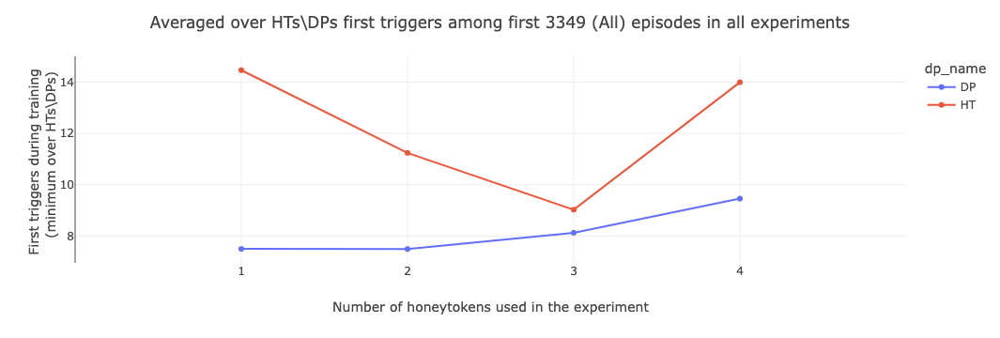

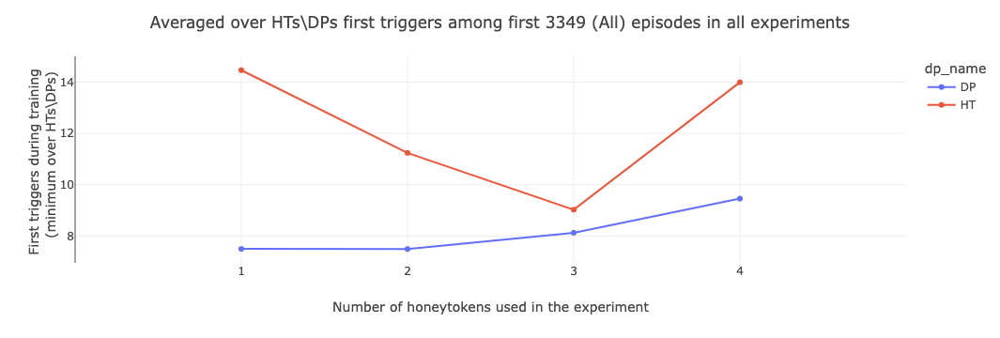

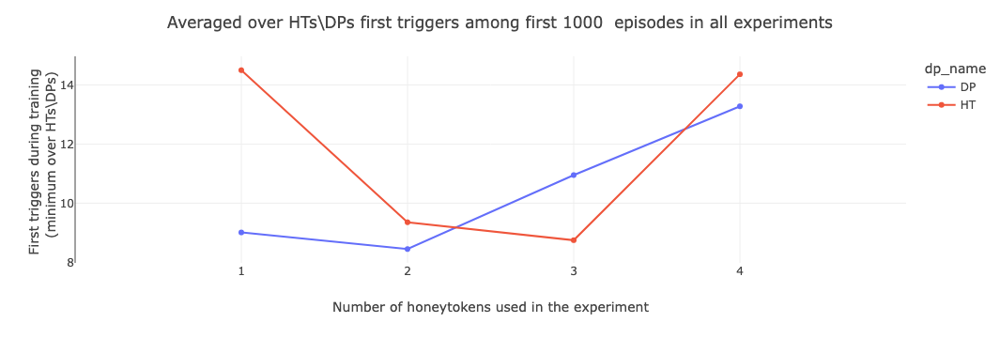

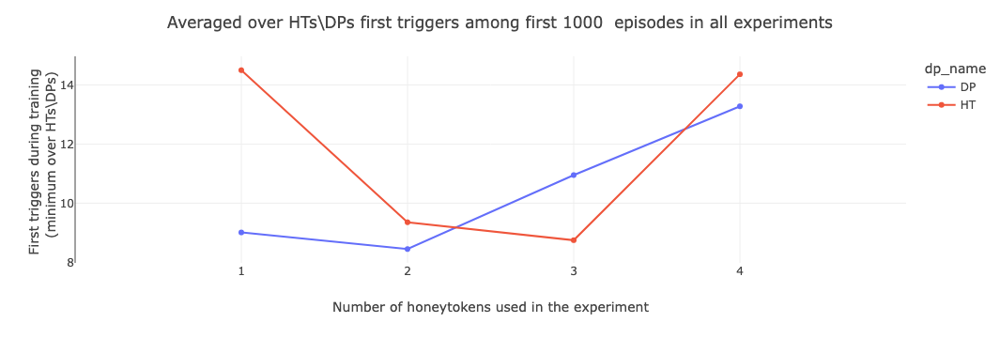

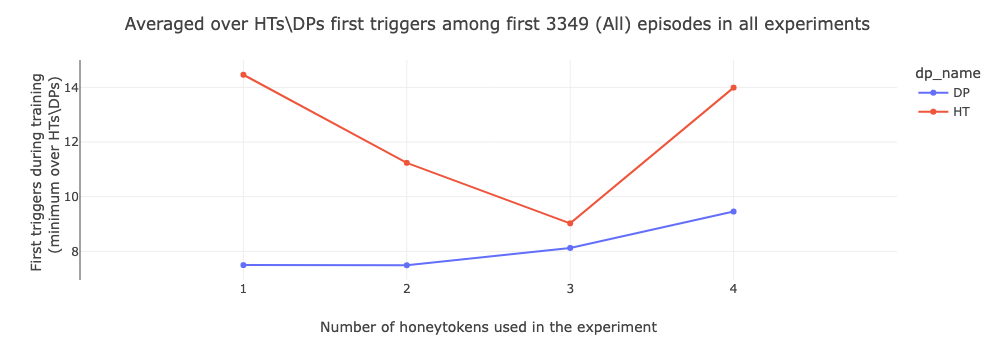

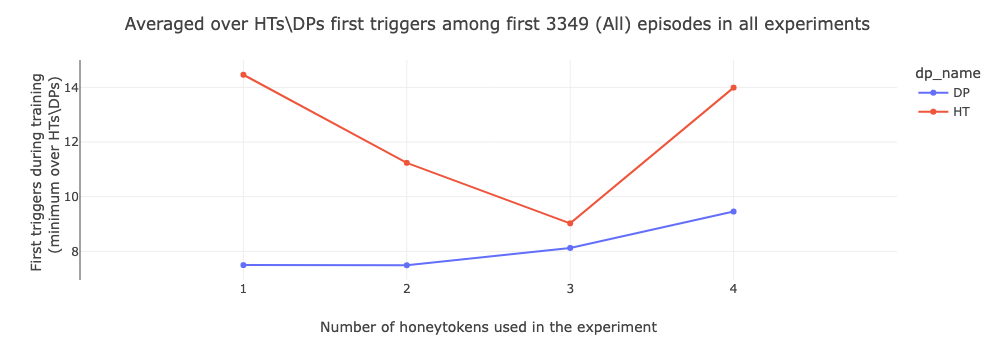

In [296]:
onlyDP, onlyHT = True, True
for form in ['pdf', 'png']:
    for end_ep in [1000, None]:
        vis_n_hts_to_metric(flag_include_DP=False, end_ep = end_ep, only_HT=onlyHT, only_DP=onlyDP,
                            filename=os.path.join('/', 'logs', 'exper', f"first_occur_htsA_dpsNA_eps{(str(end_ep) if end_ep else 'A')}{'_HT'*onlyHT}{'_DP'*onlyDP}.{form}"))
        vis_n_hts_to_metric(flag_include_DP=True, end_ep = end_ep, only_HT=onlyHT, only_DP=onlyDP,
                            filename=os.path.join('/', 'logs', 'exper', f"first_occur_htsA_dpsA_eps{(str(end_ep) if end_ep else 'A')}{'_HT'*onlyHT}{'_DP'*onlyDP}.{form}"))

### Supplement visualization

<AxesSubplot: title={'center': 'first_ind'}, xlabel='n_ht'>

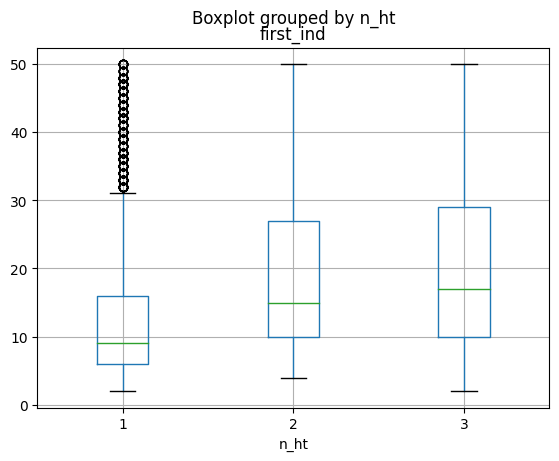

In [82]:
df_valid_indices.boxplot(by="n_ht", column="first_ind")

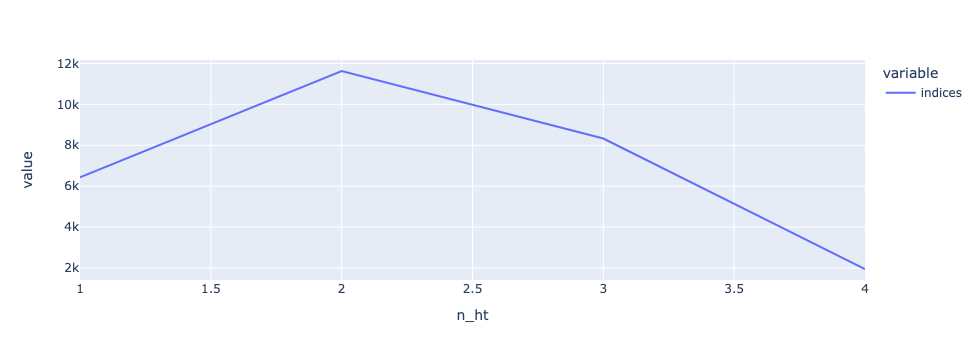

In [592]:
valid_grouped["indices"].apply(lambda x: len(x)).plot()

1         AxesSubplot(0.1,0.559091;0.363636x0.340909)
2    AxesSubplot(0.536364,0.559091;0.363636x0.340909)
3             AxesSubplot(0.1,0.15;0.363636x0.340909)
4        AxesSubplot(0.536364,0.15;0.363636x0.340909)
dtype: object

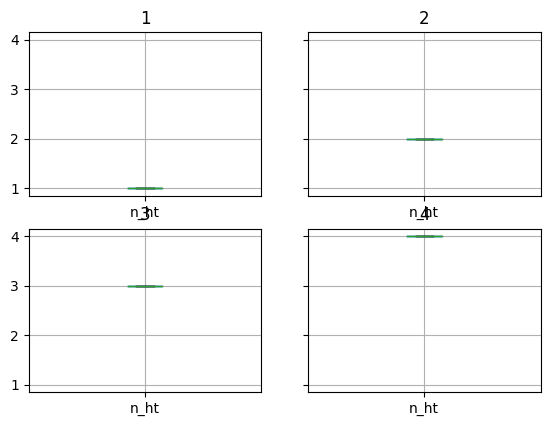

In [115]:
valid_grouped.boxplot(column='n_ht')

In [99]:
first_n_eps =  50
grouped[["indices", "epnumber"]].filter(lambda x:w (x["epnumber"] < first_n_eps).any()).apply(lambda x: x.loc[valid_indexes, "indices"].apply(lambda indices: indices[0]).mean()).plot(
    ylabel="First occurence", marker='o', xticks=list(grouped.groups.keys()))

Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/IPython/core/interactiveshell.py", line 3505, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/tmp/ipykernel_896572/4020034505.py", line 2, in <module>
    grouped[["indices", "epnumber"]].filter(lambda x: (x["epnumber"] < first_n_eps).any()).apply(lambda x: x.loc[valid_indexes, "indices"].apply(lambda indices: indices[0]).mean()).plot(
  File "/usr/local/lib/python3.9/dist-packages/pandas/core/frame.py", line 9428, in apply
    return op.apply().__finalize__(self, method="apply")
  File "/usr/local/lib/python3.9/dist-packages/pandas/core/apply.py", line 678, in apply
    return self.apply_standard()
  File "/usr/local/lib/python3.9/dist-packages/pandas/core/apply.py", line 798, in apply_standard
    results, res_index = self.apply_series_generator()
  File "/usr/local/lib/python3.9/dist-packages/pandas/core/apply.py", line 814, in apply_series_generator
    results[i] = self.f(v

<AxesSubplot: xlabel='n_ht', ylabel='First occurence'>

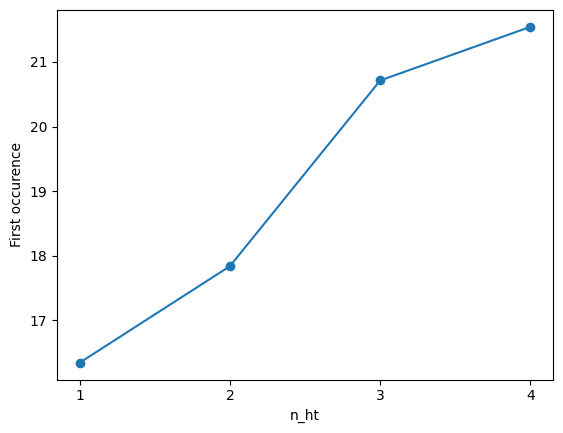

In [67]:
grouped.apply(lambda x: x.loc[valid_indexes, "indices"].apply(lambda indices: indices[0]).mean()).plot(
    ylabel="First occurence", marker='o', xticks=list(grouped.groups.keys()))

In [33]:
valid_grouped.get_group(2).columns

Index(['gymid', 'date', 'indices', 'eplength', 'n_ht'], dtype='object')

Unexpected exception formatting exception. Falling back to standard exception


Traceback (most recent call last):
  File "/usr/local/lib/python3.9/dist-packages/IPython/core/interactiveshell.py", line 3505, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "/tmp/ipykernel_896572/1351047965.py", line 1, in <module>
    valid_grouped.boxplot(column="indices", subplots=False)
  File "/usr/local/lib/python3.9/dist-packages/pandas/plotting/_core.py", line 597, in boxplot_frame_groupby
    return plot_backend.boxplot_frame_groupby(
  File "/usr/local/lib/python3.9/dist-packages/pandas/plotting/_matplotlib/boxplot.py", line 540, in boxplot_frame_groupby
    ret = df.boxplot(
  File "/usr/local/lib/python3.9/dist-packages/pandas/plotting/_core.py", line 507, in boxplot_frame
    return plot_backend.boxplot_frame(
  File "/usr/local/lib/python3.9/dist-packages/pandas/plotting/_matplotlib/boxplot.py", line 469, in boxplot_frame
    ax = boxplot(
  File "/usr/local/lib/python3.9/dist-packages/pandas/plotting/_matplotlib/boxplot.py", line 446, in boxpl

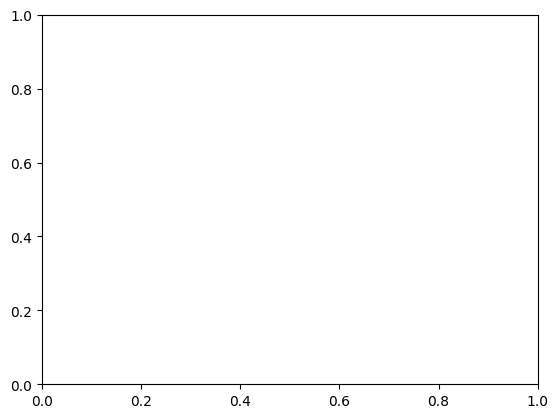

In [35]:
valid_grouped.boxplot(column="indices", subplots=False)

df.groupby("n_ht").plot(x='n_ht'subplots=False, kind='scatter')

df.groupby("n_ht").plot(y="eplength", kind='box')

## Appendix

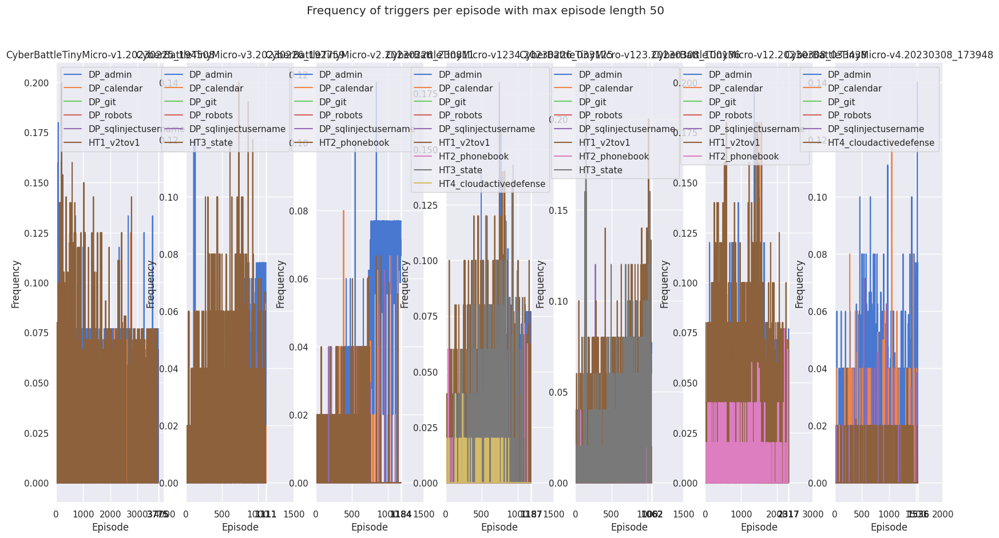

In [38]:
sns.set(style="darkgrid", palette="muted", color_codes=True)
nrows, ncols=max(len(expers[gymid]) for gymid in expers),len(expers)
axes = {}

detection_points_dict = 
fig = plt.figure(figsize=(20, 10))
for name in detection_points_dict:
    gymid, date, detection_point = name.split('.')
    j, i = list(expers.keys()).index(gymid), expers[gymid].index(date)
    if (i, j) not in axes:
        ax = fig.add_subplot(nrows, ncols, i*ncols + j + 1)
        axes[(i, j)] = ax
    else:
        ax = axes[(i, j)]
    n_occurencies = len(detection_points_dict[name]['indices'])
    N = len(detection_points_dict[name]['eplength'])

        n_occur_per_episode = np.ravel(np.array(all_occur.sum(axis=1)))
        # only episodes which have nonzero inclusions
        if freq_not_count:
            freq_occur_per_episode = (n_occur_per_episode[-n_last_episodes:])[n_occur_per_episode[-n_last_episodes:] > 0] / \
                eplength[-n_last_episodes:][n_occur_per_episode[-n_last_episodes:] > 0]
        else:
            freq_occur_per_episode = (n_occur_per_episode[-n_last_episodes:])[n_occur_per_episode[-n_last_episodes:] > 0]
        freq_occur_per_episode = freq_occur_per_episode if len(freq_occur_per_episode) else [0]*n_epis
        ax.bar(w_M / 2 + dp_index / N + exper_index * w_M, freq_occur_per_episode.mean(), width=w_M, color=color[exper_index], align='center', label=exper_name)

    all_occur = scipy.sparse.csr_matrix(([True] * n_occurencies, detection_points_dict[name]['indices'], detection_points_dict[name]['indptr']), shape=(N, iteration_count))
    n_occur_per_episode = np.array(all_occur.sum(axis=1)).reshape(-1)
    freq_occur_per_episode = n_occur_per_episode / detection_points_dict[name]['eplength']
    ax.plot(np.arange(len(n_occur_per_episode)), freq_occur_per_episode, label=detection_point)
    ax.set_xlabel("Episode")
    ax.set_ylabel("Frequency")
    #ax.set_ylim(0, max(list(freq_occur_per_episode) + [0] + ax.get_ylim()[1]))
    eplength = len(detection_points_dict[name]['eplength'])
    ax.set_xlim(0, eplength + 1)
    ax.set_title(gymid + '.' + date)
    extraxticks = [len(detection_points_dict[name]['eplength'])]
    ax.set_xticks(list(ax.get_xticks()) + extraxticks)
    ax.legend()
_ = fig.suptitle(f"Frequency of triggers per episode with max episode length {max_episode_steps}")

In [95]:
all_expers.keys()

dict_keys(['CyberBattleTinyMicro-v1', 'CyberBattleTinyMicro-v3', 'CyberBattleTinyMicro-v2', 'CyberBattleTinyMicro-v1234', 'CyberBattleTinyMicro-v123', 'CyberBattleTinyMicro-v12', 'CyberBattleTinyMicro-v4'])

1


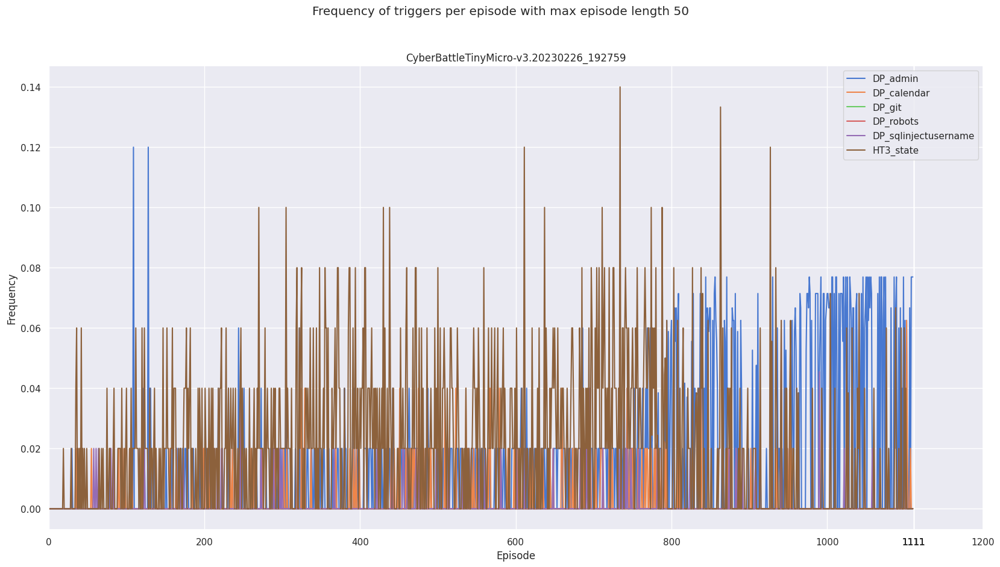

In [94]:
expers = {key: [all_expers[key][-1]] for key in all_expers if 'v3' in key}
detection_points_results = {exper_name: value for exper_name, value in all_detection_points_results.items() 
                         if exper_name.split('.')[1] in ''.join(map(lambda x: ''.join(x), expers.values()))}

print(len(detection_points_results))

sns.set(style="darkgrid", palette="muted", color_codes=True)
nrows, ncols=max(len(expers[gymid]) for gymid in expers),len(expers)
axes = {}

fig = plt.figure(figsize=(20, 10))
for exper_name, dp_name in detection_points_results.items():
    for detection_point in dp_name:
        gymid, date = exper_name.split('.')
        j, i = list(expers.keys()).index(gymid), expers[gymid].index(date)
        if (i, j) not in axes:
            ax = fig.add_subplot(nrows, ncols, i*ncols + j + 1)
            axes[(i, j)] = ax
        else:
            ax = axes[(i, j)]
        csr_matrix_lists = detection_points_results[exper_name][detection_point]
        n_occurencies = len(csr_matrix_lists['indices'])
        N = len(csr_matrix_lists['eplength'])

        # n_episodes x 50: 1

        all_occur = scipy.sparse.csr_matrix(([True] * n_occurencies, csr_matrix_lists['indices'], csr_matrix_lists['indptr']), shape=(N, iteration_count))
        n_occur_per_episode = np.array(all_occur.sum(axis=1)).reshape(-1)
        freq_occur_per_episode = n_occur_per_episode / csr_matrix_lists['eplength']
        ax.plot(np.arange(len(n_occur_per_episode)), freq_occur_per_episode, label=detection_point)
        ax.set_xlabel("Episode")
        ax.set_ylabel("Frequency")
        #ax.set_ylim(0, max(list(freq_occur_per_episode) + [0] + ax.get_ylim()[1]))
        eplength = len(csr_matrix_lists['eplength'])
        ax.set_xlim(0, eplength)
        ax.set_title(gymid + '.' + date)
        extraxticks = [len(csr_matrix_lists['eplength'])]
        ax.set_xticks(list(ax.get_xticks()) + extraxticks)
        ax.legend()
    _ = fig.suptitle(f"Frequency of triggers per episode with max episode length {max_episode_steps}")

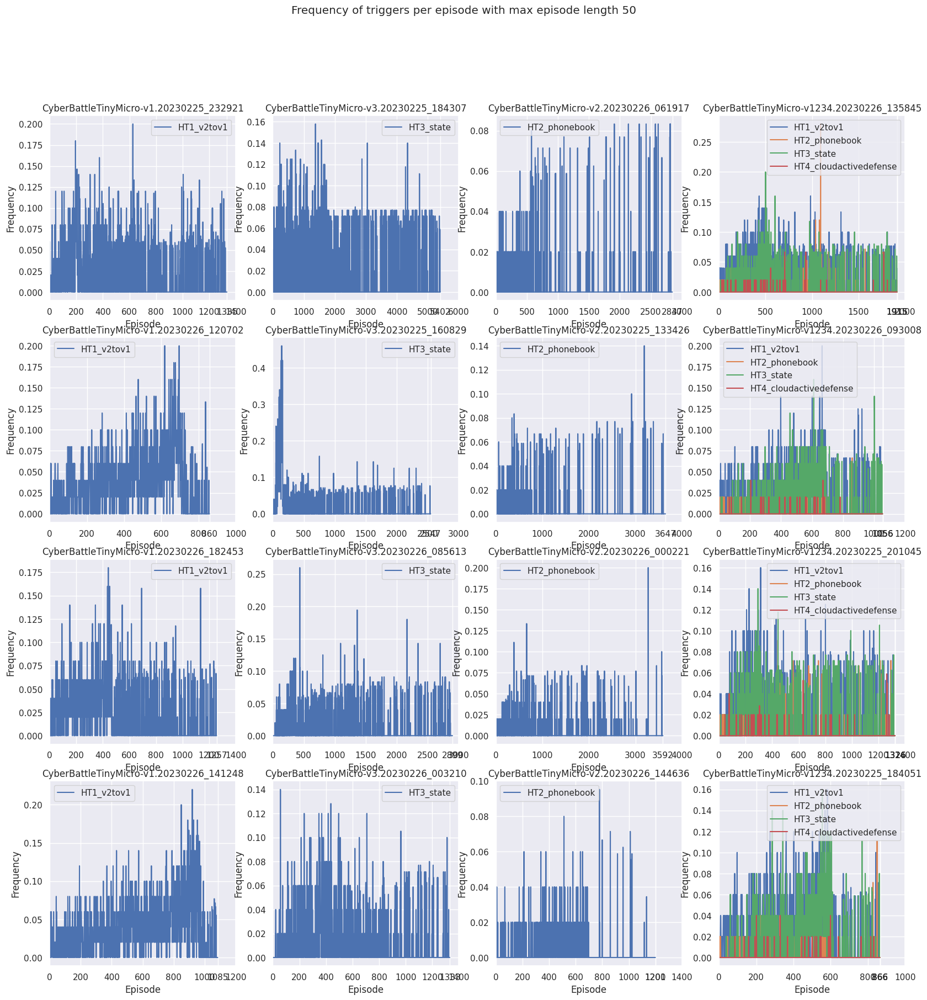

In [200]:
cur_expers = {key: [date for j, date in enumerate(all_expers[key]) if j <= 3] for i, key in enumerate(all_expers.keys()) if i <= 3 } # {"CyberBattleTinyMicro-v1":["20230127_105836"], "CyberBattleTinyMicro-v100":["20230127_105321", "20230127_105636"]}

detection_points_npz = {}
for gymid in cur_expers:
    for date in cur_expers[gymid]:
        checkpoint_dir = os.path.join(log_dir, gymid, date)
        detection_points_npz[gymid + '.' + date] = np.load(os.path.join(checkpoint_dir, 'training',
                                                                            'detection_points_results.npz'))

detection_point_names = set()
detection_points_indices = {}
for exper in detection_points_npz:
    for k in detection_points_npz[exper].keys():
        ht_dp_name, csr_index_type = '_'.join(k.split('_')[:-1]), k.split('_')[-1]
        if not include_dps and "dp" in ht_dp_name.lower():
            continue
        detection_point_names |= {ht_dp_name}
        detection_points_indices[exper + '.' + ht_dp_name] = detection_points_indices.get(exper + '.' + ht_dp_name, dict())
        detection_points_indices[exper + '.' + ht_dp_name].update({csr_index_type: detection_points_npz[exper][k]})
dp_names = sorted(list((detection_point_names)))
exper_names = sorted(list(detection_points_npz.keys()))

nrows, ncols=max(len(cur_expers[gymid]) for gymid in cur_expers), len(cur_expers)
axes = {}

fig = plt.figure(figsize=(20, 20))
for name in detection_points_indices:
    gymid, date, detection_point = name.split('.')
    j, i = list(cur_expers.keys()).index(gymid), cur_expers[gymid].index(date)
    if (i, j) not in axes:
        ax = fig.add_subplot(nrows, ncols, i*ncols + j + 1)
        axes[(i, j)] = ax
    else:
        ax = axes[(i, j)]
    n_occurencies = len(detection_points_indices[name]['indices'])
    N = len(detection_points_indices[name]['eplength'])

    # n_episodes x 50: 1

    all_occur = scipy.sparse.csr_matrix(([True] * n_occurencies, detection_points_indices[name]['indices'], detection_points_indices[name]['indptr']), shape=(N, iteration_count))
    n_occur_per_episode = np.array(all_occur.sum(axis=1)).reshape(-1)
    freq_occur_per_episode = n_occur_per_episode / detection_points_indices[name]['eplength']
    ax.plot(np.arange(len(n_occur_per_episode)), freq_occur_per_episode, label=detection_point)
    ax.set_xlabel("Episode")
    ax.set_ylabel("Frequency")

    eplength = len(detection_points_indices[name]['eplength'])
    ax.set_xlim(0, eplength)
    ax.set_title(gymid + '.' + date)
    extraxticks = [len(detection_points_indices[name]['eplength'])]
    ax.set_xticks(list(ax.get_xticks()) + extraxticks)
    ax.legend()
_ = fig.suptitle(f"Frequency of triggers per episode with max episode length {max_episode_steps}")

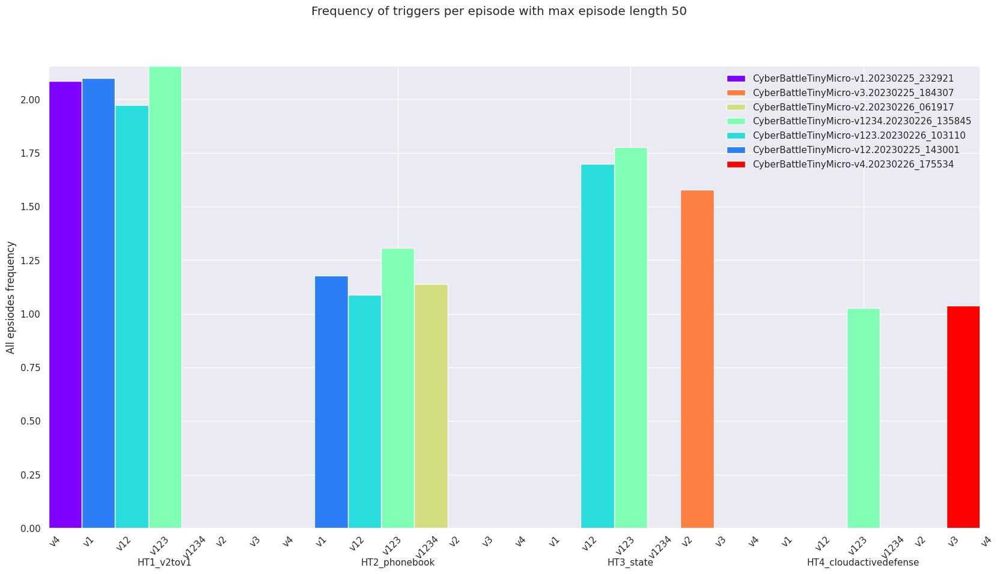

In [ ]:
sns.set(style="darkgrid", color_codes=True) # 
# nrows, ncols = max(len(expers[gymid]) for gymid in expers), len(expers)
# axes = {}
fig = plt.figure(figsize=(20, 10))
ax = plt.subplot(111)

N, M = len(dp_names), len(exper_names)
w_N = 1/N
w_M = w_N/M

color = cm.rainbow(np.linspace(0, 1, M))
n_last_episodes = 0 # 50 # for all episodes (=0)
freq_not_count = False
for exper_ht_dp_name in detection_points_indices:
    # construct axes in fig, and log its index (i, j) inside axes
    gymid, date, detection_point = exper_ht_dp_name.split('.')
    exper_name = gymid + '.' + date
    exper_index, dp_index = exper_names.index(exper_name), dp_names.index(detection_point)
    # j, i = list(expers.keys()).index(gymid), expers[gymid].index(date) # get indices of "gymid: date" inside (key, val) pair 
    # if (i, j) not in axes:
    #     ax = fig.add_subplot(nrows, ncols, i * ncols + j + 1)
    #     axes[(i, j)] = ax
    # else:
    #     ax = axes[(i, j)]
    
    n_nonzero = len(detection_points_indices[exper_ht_dp_name]['indices'])
    N_episodes = len(detection_points_indices[exper_ht_dp_name]['eplength'])
    # n_episodes x 50
    all_occur = scipy.sparse.csr_matrix(([True] * n_nonzero, detection_points_indices[exper_ht_dp_name]['indices'], 
                                         detection_points_indices[exper_ht_dp_name]['indptr']), 
                                         shape=(N_episodes, max_episode_steps))
    n_occur_per_episode = np.array(all_occur.sum(axis=1)).reshape(-1)
    # only episodes which have nonzero inclusions
    if freq_not_count:
        freq_occur_per_episode = (n_occur_per_episode[-n_last_episodes:])[n_occur_per_episode[-n_last_episodes:] > 0] / \
            detection_points_indices[exper_ht_dp_name]['eplength'][-n_last_episodes:][n_occur_per_episode[-n_last_episodes:] > 0]
    else:
        freq_occur_per_episode = (n_occur_per_episode[-n_last_episodes:])[n_occur_per_episode[-n_last_episodes:] > 0]
    freq_occur_per_episode = freq_occur_per_episode if len(freq_occur_per_episode) else [0, 0, 0]
    ax.bar(w_M / 2 + dp_index / N + exper_index * w_M, freq_occur_per_episode.mean(), width=w_M, color=color[exper_index], align='center', label=exper_name)
    # ax.plot(np.arange(len(n_occur_per_episode))[n_occur_per_episode > 0], freq_occur_per_episode, label=detection_point)
# ax.set_xlabel("Episode")
ax.set_ylabel(f"Last {n_last_episodes} "*(n_last_episodes != 0) + (not n_last_episodes)*"All "+ "epsiodes frequency")
    # ax.set_ylim(0, max(list(freq_occur_per_episode) + [0] + ax.get_ylim()[1]))
    # eplength = len(detection_points_indices[exper_ht_dp_name]['eplength'])
    # ax.set_xlim(0, eplength)
    # ax.set_title(gymid + '.' + date)
# extraxticks = [len(detection_points_indices[exper_ht_dp_name]['eplength'])]
# ax.set_xticks(list(ax.get_xticks()) + extraxticks)
ax.xaxis.set_major_locator(plt.FixedLocator(np.linspace(0, 1, N+1)[:-1] + w_N/2))
ax.xaxis.set_major_formatter(plt.FixedFormatter(dp_names))
ax.xaxis.set_minor_locator(plt.FixedLocator(np.linspace(0, 1, N*M+1))) # - w_M/2))
ax.xaxis.set_minor_formatter(plt.FuncFormatter(lambda val, tick_number: exper_names[(tick_number - 1) % M].split('-')[1].split('.')[0]))
ax.tick_params(axis='x', pad=30)
plt.setp( ax.xaxis.get_minorticklabels(), rotation=45, ha='left')
# for tick in ax.xaxis.get_minor_ticks():
#     tick.label1.set_rotation(45)
#     tick.label1.set_rotation(45)
# plt.setp(ax.get_xticklabels(), rotation=70, horizontalalignment='right')
ax.autoscale(tight=True)


handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(), frameon=False)

_ = fig.suptitle(f"Frequency of triggers per episode with max episode length {max_episode_steps}")
